# Raster scan analysis  
In this notebook analyze the fringe pattern in the FM point source raster scan observations.  
  
Notebook creation date: 28th of January 2018  
Author: Ioannis Argyriou (Institute of Astronomy, KUL)  
Email: ioannis.argyriou@kuleuven.be

## > Import modules

In [1]:
from distortionMaps import d2cMapping
import mrs_aux as maux
import funcs

import numpy as np
from astropy.io import fits
import scipy.interpolate as scp_interpolate
from matplotlib import pyplot as plt
%matplotlib notebook

import warnings
warnings.simplefilter('ignore')

frame = (18,6) # figsize parameter dimensions for plotting

## > Get data

In [3]:
# Define paths to data
workDir  = '/Users/ioannisa/Desktop/python/miri_devel/'
cdpDir   = workDir+'cdp_data/'
lvl2path = workDir+'FM_data/LVL2/'

# Get data
# Left side of FOV
rasterscan_sci_files = {'P1':lvl2path+'FM1T00012204/MIRFM1T00012204_1_495_SE_2011-06-27T22h27m07_LVL2.fits',
                      'P2':lvl2path+'FM1T00012204/MIRFM1T00012204_2_495_SE_2011-06-27T22h42m57_LVL2.fits',
                      'P3':lvl2path+'FM1T00012204/MIRFM1T00012204_3_495_SE_2011-06-27T22h58m48_LVL2.fits',
                      'P4':lvl2path+'FM1T00012204/MIRFM1T00012204_4_495_SE_2011-06-27T23h14m33_LVL2.fits',
                      'P5':lvl2path+'FM1T00012204/MIRFM1T00012204_5_495_SE_2011-06-27T23h30m18_LVL2.fits',
                      'P6':lvl2path+'FM1T00012204/MIRFM1T00012204_6_495_SE_2011-06-27T23h46m09_LVL2.fits',
                      'P7':lvl2path+'FM1T00012204/MIRFM1T00012204_7_495_SE_2011-06-28T00h01m59_LVL2.fits',
                      'P8':lvl2path+'FM1T00012204/MIRFM1T00012204_8_495_SE_2011-06-28T00h17m50_LVL2.fits',
                      'P9':lvl2path+'FM1T00012204/MIRFM1T00012204_9_495_SE_2011-06-28T00h33m35_LVL2.fits',
                      'P10':lvl2path+'FM1T00012204/MIRFM1T00012204_10_495_SE_2011-06-28T00h49m31_LVL2.fits',
                      'P11':lvl2path+'FM1T00012204/MIRFM1T00012204_11_495_SE_2011-06-28T01h05m16_LVL2.fits',
                      'P12':lvl2path+'FM1T00012204/MIRFM1T00012204_12_495_SE_2011-06-28T01h21m02_LVL2.fits',
                      'P13':lvl2path+'FM1T00012204/MIRFM1T00012204_13_495_SE_2011-06-28T01h36m52_LVL2.fits',
                      'P14':lvl2path+'FM1T00012204/MIRFM1T00012204_14_495_SE_2011-06-28T01h52m42_LVL2.fits',
                      'P15':lvl2path+'FM1T00012204/MIRFM1T00012204_15_495_SE_2011-06-28T02h08m33_LVL2.fits',
                      'P16':lvl2path+'FM1T00012204/MIRFM1T00012204_16_495_SE_2011-06-28T02h24m23_LVL2.fits',
                      'P17':lvl2path+'FM1T00012204/MIRFM1T00012204_17_495_SE_2011-06-28T02h40m09_LVL2.fits',
                      'P18':lvl2path+'FM1T00012204/MIRFM1T00012204_18_495_SE_2011-06-28T02h55m54_LVL2.fits',
                      'P19':lvl2path+'FM1T00012204/MIRFM1T00012204_19_495_SE_2011-06-28T03h11m50_LVL2.fits',
                      'P20':lvl2path+'FM1T00012204/MIRFM1T00012204_20_495_SE_2011-06-28T03h27m35_LVL2.fits',
                      'P21':lvl2path+'FM1T00012204/MIRFM1T00012204_21_495_SE_2011-06-28T03h43m20_LVL2.fits',
                      'P22':lvl2path+'FM1T00012204/MIRFM1T00012204_22_495_SE_2011-06-28T03h59m11_LVL2.fits',
                      'P23':lvl2path+'FM1T00012204/MIRFM1T00012204_23_495_SE_2011-06-28T04h14m56_LVL2.fits'}
bkg_file = lvl2path+'FM1T00012203/MIRFM1T00012203_1_495_SE_2011-06-27T22h03m11_LVL2.fits'

# Middle of FOV
rasterscan_sci_files = {'P1':lvl2path+'FM1T00012308/MIRFM1T00012308_1_495_SE_2011-06-30T22h43m36_LVL2.fits',
                        'P2':lvl2path+'FM1T00012308/MIRFM1T00012308_2_495_SE_2011-06-30T22h59m21_LVL2.fits',
                        'P3':lvl2path+'FM1T00012308/MIRFM1T00012308_3_495_SE_2011-06-30T23h15m12_LVL2.fits',
                        'P4':lvl2path+'FM1T00012308/MIRFM1T00012308_4_495_SE_2011-06-30T23h31m02_LVL2.fits',
                        'P5':lvl2path+'FM1T00012308/MIRFM1T00012308_5_495_SE_2011-06-30T23h46m53_LVL2.fits',
                        'P6':lvl2path+'FM1T00012308/MIRFM1T00012308_6_495_SE_2011-07-01T00h02m38_LVL2.fits',
                        'P7':lvl2path+'FM1T00012308/MIRFM1T00012308_7_495_SE_2011-07-01T00h18m29_LVL2.fits',
                        'P8':lvl2path+'FM1T00012308/MIRFM1T00012308_8_495_SE_2011-07-01T00h34m19_LVL2.fits',
                        'P9':lvl2path+'FM1T00012308/MIRFM1T00012308_9_495_SE_2011-07-01T00h50m05_LVL2.fits',
                        'P10':lvl2path+'FM1T00012308/MIRFM1T00012308_10_495_SE_2011-07-01T01h06m05_LVL2.fits',
                        'P11':lvl2path+'FM1T00012308/MIRFM1T00012308_11_495_SE_2011-07-01T01h21m50_LVL2.fits',
                        'P12':lvl2path+'FM1T00012308/MIRFM1T00012308_12_495_SE_2011-07-01T01h37m36_LVL2.fits',
                        'P13':lvl2path+'FM1T00012308/MIRFM1T00012308_13_495_SE_2011-07-01T01h53m21_LVL2.fits',
                        'P14':lvl2path+'FM1T00012308/MIRFM1T00012308_14_495_SE_2011-07-01T02h09m17_LVL2.fits',
                        'P15':lvl2path+'FM1T00012308/MIRFM1T00012308_15_495_SE_2011-07-01T02h25m02_LVL2.fits',
                        'P16':lvl2path+'FM1T00012308/MIRFM1T00012308_16_495_SE_2011-07-01T02h40m52_LVL2.fits',
                        'P17':lvl2path+'FM1T00012308/MIRFM1T00012308_17_495_SE_2011-07-01T02h56m38_LVL2.fits',
                        'P18':lvl2path+'FM1T00012308/MIRFM1T00012308_18_495_SE_2011-07-01T03h12m23_LVL2.fits',
                        'P19':lvl2path+'FM1T00012308/MIRFM1T00012308_19_495_SE_2011-07-01T03h28m19_LVL2.fits',
                        'P20':lvl2path+'FM1T00012308/MIRFM1T00012308_20_495_SE_2011-07-01T03h44m04_LVL2.fits',
                        'P21':lvl2path+'FM1T00012308/MIRFM1T00012308_21_495_SE_2011-07-01T03h59m55_LVL2.fits',
                        'P22':lvl2path+'FM1T00012308/MIRFM1T00012308_22_495_SE_2011-07-01T04h15m40_LVL2.fits',
                        'P23':lvl2path+'FM1T00012308/MIRFM1T00012308_23_495_SE_2011-07-01T04h31m30_LVL2.fits',
                        'P24':lvl2path+'FM1T00012308/MIRFM1T00012308_24_495_SE_2011-07-01T04h47m16_LVL2.fits',
                        'P25':lvl2path+'FM1T00012308/MIRFM1T00012308_25_495_SE_2011-07-01T05h03m06_LVL2.fits',
                        'P26':lvl2path+'FM1T00012308/MIRFM1T00012308_26_495_SE_2011-07-01T05h18m52_LVL2.fits',
                        'P27':lvl2path+'FM1T00012308/MIRFM1T00012308_27_495_SE_2011-07-01T05h34m43_LVL2.fits'}
bkg_file = lvl2path+'FM1T00012203/MIRFM1T00012203_1_495_SE_2011-06-27T22h03m11_LVL2.fits'

# Right side of FOV
rasterscan_sci_files = {'P1':lvl2path+'FM1T00012206/MIRFM1T00012206_1_495_SE_2011-06-28T04h51m37_LVL2.fits',
                        'P2':lvl2path+'FM1T00012206/MIRFM1T00012206_2_495_SE_2011-06-28T05h07m28_LVL2.fits',
                        'P3':lvl2path+'FM1T00012206/MIRFM1T00012206_3_495_SE_2011-06-28T05h23m13_LVL2.fits',
                        'P4':lvl2path+'FM1T00012206/MIRFM1T00012206_4_495_SE_2011-06-28T05h39m04_LVL2.fits',
                        'P5':lvl2path+'FM1T00012206/MIRFM1T00012206_5_495_SE_2011-06-28T05h54m49_LVL2.fits',
                        'P6':lvl2path+'FM1T00012206/MIRFM1T00012206_6_495_SE_2011-06-28T06h10m34_LVL2.fits',
                        'P7':lvl2path+'FM1T00012206/MIRFM1T00012206_7_495_SE_2011-06-28T06h26m30_LVL2.fits',
                        'P8':lvl2path+'FM1T00012206/MIRFM1T00012206_8_495_SE_2011-06-28T06h42m15_LVL2.fits',
                        'P9':lvl2path+'FM1T00012206/MIRFM1T00012206_9_495_SE_2011-06-28T06h58m11_LVL2.fits',
                        'P10':lvl2path+'FM1T00012206/MIRFM1T00012206_10_495_SE_2011-06-28T07h13m56_LVL2.fits',
                        'P11':lvl2path+'FM1T00012206/MIRFM1T00012206_11_495_SE_2011-06-28T07h29m41_LVL2.fits',
                        'P12':lvl2path+'FM1T00012206/MIRFM1T00012206_12_495_SE_2011-06-28T07h45m32_LVL2.fits',
                        'P13':lvl2path+'FM1T00012206/MIRFM1T00012206_13_495_SE_2011-06-28T08h01m17_LVL2.fits',
                        'P14':lvl2path+'FM1T00012206/MIRFM1T00012206_14_495_SE_2011-06-28T08h17m03_LVL2.fits',
                        'P15':lvl2path+'FM1T00012206/MIRFM1T00012206_15_495_SE_2011-06-28T08h32m58_LVL2.fits',
                        'P16':lvl2path+'FM1T00012206/MIRFM1T00012206_16_495_SE_2011-06-28T08h48m44_LVL2.fits',
                        'P17':lvl2path+'FM1T00012206/MIRFM1T00012206_17_495_SE_2011-06-28T09h04m34_LVL2.fits',
                        'P18':lvl2path+'FM1T00012206/MIRFM1T00012206_18_495_SE_2011-06-28T09h20m24_LVL2.fits',
                        'P19':lvl2path+'FM1T00012206/MIRFM1T00012206_19_495_SE_2011-06-28T09h36m10_LVL2.fits',
                        'P20':lvl2path+'FM1T00012206/MIRFM1T00012206_20_495_SE_2011-06-28T09h52m00_LVL2.fits',
                        'P21':lvl2path+'FM1T00012206/MIRFM1T00012206_21_495_SE_2011-06-28T10h07m46_LVL2.fits',
                        'P22':lvl2path+'FM1T00012206/MIRFM1T00012206_22_495_SE_2011-06-28T10h23m36_LVL2.fits',
                        'P23':lvl2path+'FM1T00012206/MIRFM1T00012206_23_495_SE_2011-06-28T10h39m27_LVL2.fits'}
bkg_file = lvl2path+'FM1T00012203/MIRFM1T00012203_1_495_SE_2011-06-27T22h03m11_LVL2.fits'

sci_imgs_ET1A = {"1A":lvl2path +'FM1T00010937/MIRFM1T00010937_1_495_SE_2011-05-19T22h24m06_LVL2.fits',
            "1B":lvl2path +'FM1T00010939/MIRFM1T00010939_1_495_SE_2011-05-20T00h04m44_LVL2.fits', 
            "1C":lvl2path +'FM1T00010843/MIRFM1T00010843_1_495_SE_2011-05-18T00h47m06_LVL2.fits', 
            "2A":lvl2path +'FM1T00010937/MIRFM1T00010937_1_495_SE_2011-05-19T22h24m06_LVL2.fits', 
            "2B":lvl2path +'FM1T00010939/MIRFM1T00010939_1_495_SE_2011-05-20T00h04m44_LVL2.fits', 
            "2C":lvl2path +'FM1T00010843/MIRFM1T00010843_1_495_SE_2011-05-18T00h47m06_LVL2.fits', 
            "3A":lvl2path +'FM1T00010937/MIRFM1T00010937_1_494_SE_2011-05-19T22h23m43_LVL2.fits', 
            "3B":lvl2path +'FM1T00010939/MIRFM1T00010939_1_494_SE_2011-05-20T00h04m21_LVL2.fits', 
            "3C":lvl2path +'FM1T00010843/MIRFM1T00010843_1_494_SE_2011-05-18T00h46m35_LVL2.fits', 
            "4A":lvl2path +'FM1T00010937/MIRFM1T00010937_1_494_SE_2011-05-19T22h23m43_LVL2.fits', 
            "4B":lvl2path +'FM1T00010939/MIRFM1T00010939_1_494_SE_2011-05-20T00h04m21_LVL2.fits', 
            "4C":lvl2path +'FM1T00010843/MIRFM1T00010843_1_494_SE_2011-05-18T00h46m35_LVL2.fits'}

bkg_imgs_ET1A = {"1A":lvl2path +'FM1T00010938/MIRFM1T00010938_1_495_SE_2011-05-19T23h16m52_LVL2.fits', 
            "1B":lvl2path +'FM1T00010940/MIRFM1T00010940_1_495_SE_2011-05-20T00h53m40_LVL2.fits', 
            "1C":lvl2path +'FM1T00010844/MIRFM1T00010844_1_495_SE_2011-05-18T01h53m59_LVL2.fits', 
            "2A":lvl2path +'FM1T00010938/MIRFM1T00010938_1_495_SE_2011-05-19T23h16m52_LVL2.fits', 
            "2B":lvl2path +'FM1T00010940/MIRFM1T00010940_1_495_SE_2011-05-20T00h53m40_LVL2.fits', 
            "2C":lvl2path +'FM1T00010844/MIRFM1T00010844_1_495_SE_2011-05-18T01h53m59_LVL2.fits', 
            "3A":lvl2path +'FM1T00010938/MIRFM1T00010938_1_494_SE_2011-05-19T23h16m30_LVL2.fits', 
            "3B":lvl2path +'FM1T00010940/MIRFM1T00010940_1_494_SE_2011-05-20T00h53m17_LVL2.fits', 
            "3C":lvl2path +'FM1T00010844/MIRFM1T00010844_1_494_SE_2011-05-18T01h53m27_LVL2.fits', 
            "4A":lvl2path +'FM1T00010938/MIRFM1T00010938_1_494_SE_2011-05-19T23h16m30_LVL2.fits', 
            "4B":lvl2path +'FM1T00010940/MIRFM1T00010940_1_494_SE_2011-05-20T00h53m17_LVL2.fits', 
            "4C":lvl2path +'FM1T00010844/MIRFM1T00010844_1_494_SE_2011-05-18T01h53m27_LVL2.fits'}

## > Transform data

In [5]:
# perform transform
band      = '2A' # this is the spectral band (side of the slope image) to be analyzed
d2cMaps   = d2cMapping(band,cdpDir) # here, d2c stands for detector to cube transformation, from x,y integer pixel coordinates, to alpha, beta (or RA and DEC), and wavelength coordinates
sliceMap  = d2cMaps['sliceMap']
lambdaMap = d2cMaps['lambdaMap']
alphaMap  = d2cMaps['alphaMap']
betaMap   = d2cMaps['betaMap']
det_dims = (1024,1032) # placeholder for the dimension of the detector
unique_betas = np.sort(np.unique(betaMap[(sliceMap>100*int(band[0])) & (sliceMap<100*(int(band[0])+1))]))

# the calibration data products (cdps) applicable to the spectral band specified above; these products are used for the calibration of the slope images, from LVL2 to so-called "LVL3" data
fringe_file,photom_file,psf_file,resol_file = funcs.get_cdps(cdpDir=cdpDir,band=band)

fringe_img,fringe_err = fits.open(fringe_file)[1].data,fits.open(fringe_file)[2].data # [unitless]
photom_img,photom_err = fits.open(photom_file)[1].data,fits.open(fringe_file)[2].data # [DN/s * pixel/mJy]
pixsiz_img    = fits.open(photom_file)[5].data  # [arcsec^2/pix]
psffits       = fits.open(psf_file)             # [unitless]
specres_table = fits.open(resol_file)[1].data   # [unitless]

lambcens,lambfwhms = funcs.spectral_gridding(band=band,d2cMaps=d2cMaps,specres_table=specres_table)

## > Modeling

In [49]:
param_list = {}
for key in rasterscan_sci_files.keys():
    print 'Pointing {}'.format(key)
    sci_img = fits.open(rasterscan_sci_files[key])[0].data[0,:,:]-fits.open(bkg_file)[0].data[0,:,:]
    param_list[key] = funcs.point_source_along_slice_centroiding(band=band,sci_img=sci_img,d2cMaps=d2cMaps,spec_grid=[lambcens,lambfwhms])
    # param_list: (0)source_center_slice, (1)sign_amps, (2)alpha_centers, (3)alpha_sigmas, (4)bkg_amps


Pointing P10
Slice 9 has the largest summed flux
Pointing P11
Slice 9 has the largest summed flux
Pointing P12
Slice 9 has the largest summed flux
Pointing P13
Slice 9 has the largest summed flux
Pointing P14
Slice 9 has the largest summed flux
Pointing P15
Slice 9 has the largest summed flux
Pointing P16
Slice 10 has the largest summed flux
Pointing P17
Slice 10 has the largest summed flux
Pointing P18
Slice 10 has the largest summed flux
Pointing P19
Slice 10 has the largest summed flux
Pointing P2
Slice 6 has the largest summed flux
Pointing P3
Slice 7 has the largest summed flux
Pointing P1
Slice 6 has the largest summed flux
Pointing P6
Slice 8 has the largest summed flux
Pointing P7
Slice 8 has the largest summed flux
Pointing P4
Slice 7 has the largest summed flux
Pointing P5
Slice 8 has the largest summed flux
Pointing P8
Slice 8 has the largest summed flux
Pointing P9
Slice 9 has the largest summed flux
Pointing P25
Slice 12 has the largest summed flux
Pointing P24
Slice 11 ha

In [6]:
# funcs.save_obj(param_list,'rasterscan_middleofFOV_centroidparams_band2A')
param_list = funcs.load_obj('rasterscan_leftsideFOV_centroidparams_band2A')

In [7]:
norm_spectra = {}
for key in param_list.keys():
    print 'Pointing {}'.format(key)
    wavl = np.array(lambcens)
    spectrum = param_list[key][1]
    
    omit_nan = ~np.isnan(spectrum)
    wavl_noNaN = wavl[omit_nan]
    spectrum_noNaN = spectrum[omit_nan]
    
    # start
    wvnr = np.flipud(1/(wavl_noNaN/10000))
    arr  = np.flipud(spectrum_noNaN)

    # determine local maxima
    if band == '1A': min_dist = 4
    elif band == '2A': min_dist = 5
    peaks = funcs.find_peaks(arr,thres=0,min_dist=min_dist)
    arr_interpolator = scp_interpolate.InterpolatedUnivariateSpline(peaks,arr[peaks],k=3,ext=3)
    arr_profile = arr_interpolator(range(len(arr)))
    
    norm_spectra[key] = [wvnr,arr,arr/arr_profile,peaks]

Pointing P10
Pointing P11
Pointing P12
Pointing P13
Pointing P14
Pointing P15
Pointing P16
Pointing P17
Pointing P18
Pointing P19
Pointing P2
Pointing P3
Pointing P1
Pointing P6
Pointing P7
Pointing P4
Pointing P5
Pointing P8
Pointing P9
Pointing P21
Pointing P20
Pointing P23
Pointing P22


In [23]:
print 1130.57-1127.67
print (1130.57+1127.67)/2. - 2.9
for key in norm_spectra.keys():
    print len(norm_spectra[key][3])

2.9
1126.22
71
70
70
71
71
70
71
71
70
71
70
70
70
71
71
70
70
70
71
69
71
70
69


<IPython.core.display.Javascript object>


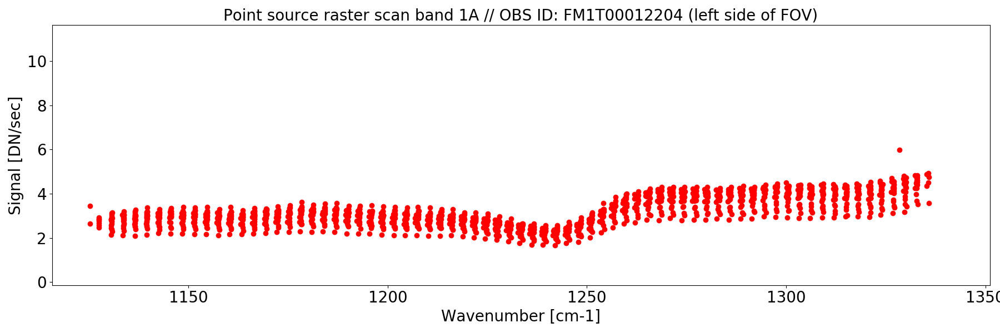

In [37]:
plt.close('all')
plt.figure(figsize=frame)
for key in ['P1','P2','P3','P4','P5','P6','P7','P8','P9','P10','P11','P12','P13','P14','P15','P16','P17','P18','P19','P20','P21','P22','P23']: # 'P1','P2','P3','P4','P5','P6','P7','P8','P9','P10','P11','P12','P13','P14','P15','P16','P17','P18','P19','P20','P21','P22','P23'
    try:
        #-- Fit interference pattern separate etalon lines
        fitparams,fitting_flag = funcs.fit_etalon_lines(norm_spectra[key][0],norm_spectra[key][1],norm_spectra[key][3],fit_func='skewed_voight',sigma0=1.,f0=0.5,a0=0.1)
        linecenter = funcs.get_linecenter(fitparams,fitting_flag)
        line_amplitude = funcs.get_amplitude(fitparams,fitting_flag)

    #     plt.plot(norm_spectra[key][0],norm_spectra[key][1],label='{}, slice {}'.format(key,param_list[key][0]))
        plt.plot(linecenter,line_amplitude,'ro')
    #     funcs.plot_etalon_fit(fitparams,fitting_flag)
    #     plt.plot(norm_spectra[key][0][norm_spectra[key][3]],norm_spectra[key][1][norm_spectra[key][3]],'ro')
    #     plt.plot(norm_spectra[key][0][norm_spectra[key][3]],norm_spectra[key][1][norm_spectra[key][3]],'ro')
    except:
        continue
# plt.vlines(np.arange(1126.22,1126.22+73*2.9,2.9),1.58,5.2)
# plt.ylim(1.58,5.2)
plt.xlabel('Wavenumber [cm-1]',fontsize=20)
plt.ylabel('Signal [DN/sec]',fontsize=20)
plt.title('Point source raster scan band 1A // OBS ID: FM1T00012204 (left side of FOV)',fontsize=20)
plt.legend(loc='best',fontsize=8)
plt.tick_params(axis='both',labelsize=20)
plt.tight_layout()

# plt.figure(figsize=frame)
# for key in ['P1','P2','P3','P4','P5','P6','P7','P8','P9','P10','P11','P12','P13','P14','P15','P16','P17','P18','P19','P20','P21','P22','P23']: # 'P1','P2','P3','P4','P5','P6','P7','P8','P9','P10','P11','P12','P13','P14','P15','P16','P17','P18','P19','P20','P21','P22','P23'
#     print 'Pointing {}'.format(key)
#     #-- Fit interference pattern separate etalon lines
#     try:
#         fitparams,fitting_flag = funcs.fit_etalon_lines(norm_spectra[key][0],norm_spectra[key][1],norm_spectra[key][3],fit_func='skewed_voight',sigma0=1.,f0=0.5,a0=0.1)
#         linecenter = funcs.get_linecenter(fitparams,fitting_flag)
#         plt.plot(norm_spectra[key][0][norm_spectra[key][3]][:-1],np.diff(norm_spectra[key][0][norm_spectra[key][3]]),'ro')
#         plt.plot(np.array(linecenter)[:-1],np.diff(np.array(linecenter)),'bo')
#     except:
#         continue
# # plt.ylim(1.58,5.2)
# plt.xlabel('Wavenumber [cm-1]',fontsize=20)
# plt.ylabel('Signal [DN/sec]',fontsize=20)
# plt.title('Point source raster scan band 2A // OBS ID: FM1T00012204 (left side of FOV)',fontsize=20)
# plt.legend(loc='best',fontsize=8)
# plt.tick_params(axis='both',labelsize=20)
# plt.tight_layout()

In [ ]:
for key in ['P1']:
    islice   = params_list[key][0]
    alphacen = np.mean(params_list[key][2][~np.isnan(params_list[key][2])])

    fitparams,fitting_flag = funcs.fit_etalon_lines(norm_spectra[key][0],norm_spectra[key][1],norm_spectra[key][3],fit_func='skewed_voight',sigma0=1.,f0=0.5,a0=0.1)
    linecenter = funcs.get_linecenter(fitparams,fitting_flag)
    
    deltaWvnr_interp = scp_interpolate.interp1d(np.array(linecenter)[:-1],np.diff(np.array(linecenter)))
    

<IPython.core.display.Javascript object>


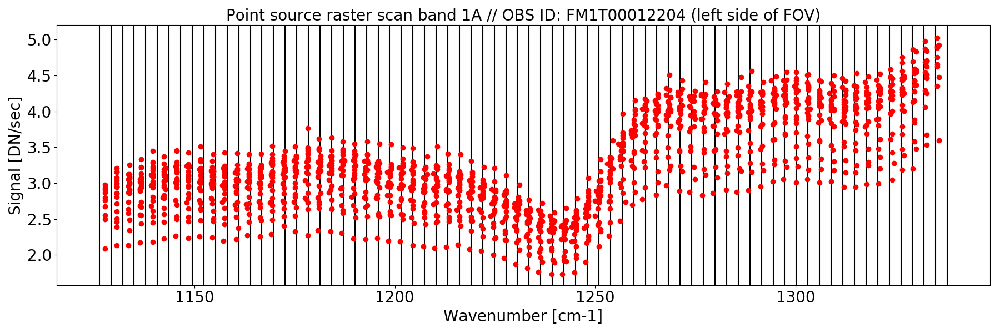

<IPython.core.display.Javascript object>


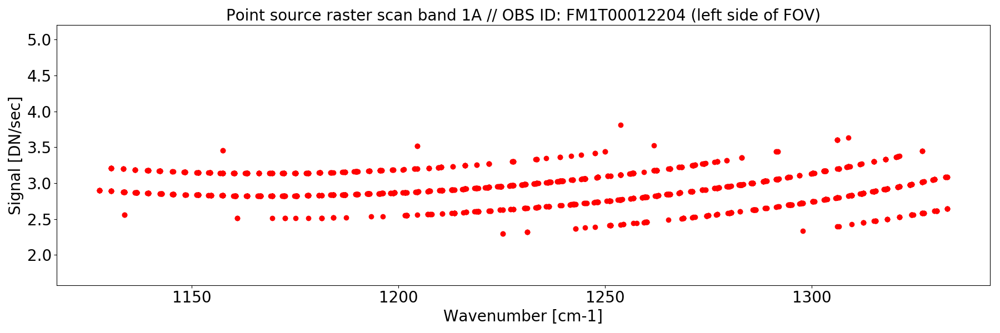

<IPython.core.display.Javascript object>


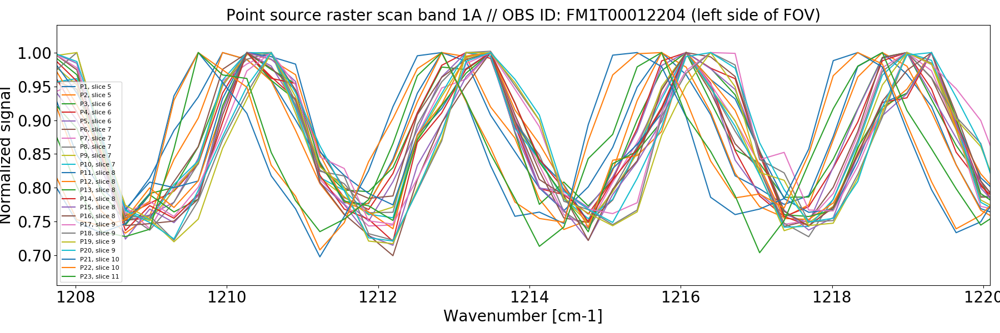

<IPython.core.display.Javascript object>


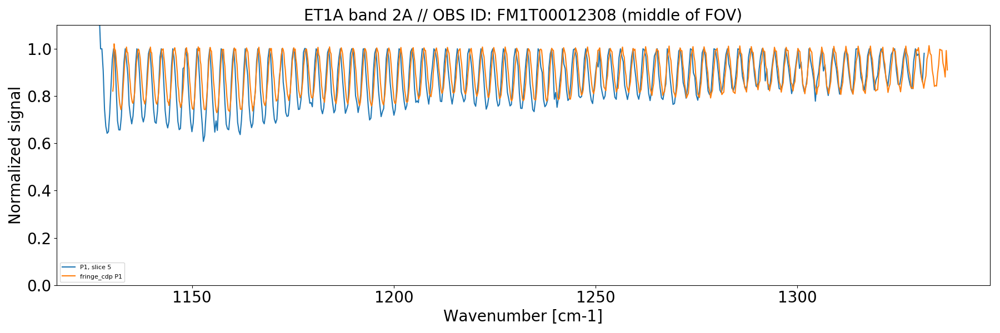

-2.8999999999998636

In [24]:
plt.close('all')

plt.figure(figsize=frame)
# plt.plot(norm_spectra['P1'][0],norm_spectra['P1'][1])
# plt.plot(norm_spectra['P1'][0][norm_spectra['P1'][3]],norm_spectra['P1'][1][norm_spectra['P1'][3]],'ro')
# for key in rasterscan_sci_imgs.keys():
for key in ['P1','P2','P3','P4','P5','P6','P7','P8','P9','P10','P11','P12','P13','P14','P15','P16','P17','P18','P19','P20','P21','P22','P23']: # 'P1','P2','P3','P4','P5','P6','P7','P8','P9','P10','P11','P12','P13','P14','P15','P16','P17','P18','P19','P20','P21','P22','P23'
#     plt.plot(np.flipud(10000/lambcens),np.flipud(param_list[key][1]),label='{}, slice {}'.format(key,param_list[key][0]))
    plt.plot(norm_spectra[key][0][norm_spectra[key][3]],norm_spectra[key][1][norm_spectra[key][3]],'ro')
plt.vlines(np.arange(1126.22,1126.22+73*2.9,2.9),1.58,5.2)
plt.ylim(1.58,5.2)
plt.xlabel('Wavenumber [cm-1]',fontsize=20)
plt.ylabel('Signal [DN/sec]',fontsize=20)
plt.title('Point source raster scan band 1A // OBS ID: FM1T00012204 (left side of FOV)',fontsize=20)
plt.legend(loc='best',fontsize=8)
# plt.ylim(0.7,1.1)
plt.tick_params(axis='both',labelsize=20)
plt.tight_layout()

plt.figure(figsize=frame)
# plt.plot(norm_spectra['P1'][0],norm_spectra['P1'][1])
# plt.plot(norm_spectra['P1'][0][norm_spectra['P1'][3]],norm_spectra['P1'][1][norm_spectra['P1'][3]],'ro')
# for key in rasterscan_sci_imgs.keys():
for key in ['P1','P2','P3','P4','P5','P6','P7','P8','P9','P10','P11','P12','P13','P14','P15','P16','P17','P18','P19','P20','P21','P22','P23']: # 'P1','P2','P3','P4','P5','P6','P7','P8','P9','P10','P11','P12','P13','P14','P15','P16','P17','P18','P19','P20','P21','P22','P23'
#     plt.plot(np.flipud(10000/lambcens),np.flipud(param_list[key][1]),label='{}, slice {}'.format(key,param_list[key][0]))
    plt.plot(norm_spectra[key][0][norm_spectra[key][3]][:-1],np.diff(norm_spectra[key][0][norm_spectra[key][3]]),'ro')
# plt.vlines(np.arange(1126.22,1126.22+73*2.9,2.9),1.58,5.2)
plt.ylim(1.58,5.2)
plt.xlabel('Wavenumber [cm-1]',fontsize=20)
plt.ylabel('Signal [DN/sec]',fontsize=20)
plt.title('Point source raster scan band 1A // OBS ID: FM1T00012204 (left side of FOV)',fontsize=20)
plt.legend(loc='best',fontsize=8)
# plt.ylim(0.7,1.1)
plt.tick_params(axis='both',labelsize=20)
plt.tight_layout()

plt.figure(figsize=frame)
# plt.plot(norm_spectra['P1'][0],norm_spectra['P1'][1])
# plt.plot(norm_spectra['P1'][0][norm_spectra['P1'][3]],norm_spectra['P1'][1][norm_spectra['P1'][3]],'ro')
# for key in rasterscan_sci_imgs.keys():
for key in ['P1','P2','P3','P4','P5','P6','P7','P8','P9','P10','P11','P12','P13','P14','P15','P16','P17','P18','P19','P20','P21','P22','P23']: # 'P1','P2','P3','P4','P5','P6','P7','P8','P9','P10','P11','P12','P13','P14','P15','P16','P17','P18','P19','P20','P21','P22','P23'
    plt.plot(norm_spectra[key][0],norm_spectra[key][2],label='{}, slice {}'.format(key,param_list[key][0]))
plt.xlabel('Wavenumber [cm-1]',fontsize=20)
plt.ylabel('Normalized signal',fontsize=20)
plt.title('Point source raster scan band 1A // OBS ID: FM1T00012204 (left side of FOV)',fontsize=20)
plt.legend(loc='best',fontsize=8)
# plt.ylim(0.7,1.1)
plt.tick_params(axis='both',labelsize=20)
plt.tight_layout()

plt.figure(figsize=frame)
for key in ['P1']: 
    plt.plot(norm_spectra[key][0],norm_spectra[key][2],label='{}, slice {}'.format(key,param_list[key][0]))

    # fringe cdp data
    islice = param_list[key][0]
    alphapos = np.mean(param_list[key][2][~np.isnan(param_list[key][2])])
    # take pixel trace along specified slice, specified alpha position
    ypos,xpos = np.arange(det_dims[0]),np.zeros(det_dims[0]) # initialize placeholders
    slice_img,alpha_img,valid_img = [np.full(det_dims,0.) for j in range(3)] # initialize placeholders
    sel_pix = (sliceMap == 100*int(band[0])+islice) # select pixels with correct slice number
    slice_img[sel_pix] = sliceMap[sel_pix] # image containing single slice
    alpha_img[sel_pix] = alphaMap[sel_pix] # image containing alpha positions in single slice

    # trace is built by taking the pixel in every detector row with alpha value closest to the one specified
    for i in ypos:
        xpos[i] = np.argmin(alpha_img[i,:])+funcs.find_nearest(alpha_img[i,:][(slice_img[i,:]!=0)],alphapos)
    xpos = xpos.astype(int)

    plt.plot(np.flipud(1/(lambdaMap[ypos,xpos]/10000)),np.flipud(fringe_img[ypos,xpos]),label='fringe_cdp {}'.format(key))
    
#     # etalon data
#     sci_img_ET1A = fits.open(sci_imgs_ET1A[band])[0].data[0,:,:]-fits.open(bkg_imgs_ET1A[band])[0].data[0,:,:]
    
#     wvnr = np.flipud(1/(lambdaMap[ypos,xpos]/10000))
#     etalon1A_fm_data = sci_img_ET1A[ypos,xpos]

#     # Determine etalon peaks
#     #--FM Etalon_1A data
#     etalon1A_fm_data[np.isnan(etalon1A_fm_data)] = -1
#     FMetalon1A_peaks = funcs.find_peaks(etalon1A_fm_data,thres=0.3,min_dist=6)
#     etalon1A_fm_data[(etalon1A_fm_data == -1)] = np.nan
#     etalon1A_fm_data_noNaN = etalon1A_fm_data.copy()
#     etalon1A_fm_data_noNaN[np.isnan(etalon1A_fm_data)] = 0.
#     arr_interpolator = scp_interpolate.InterpolatedUnivariateSpline(FMetalon1A_peaks,etalon1A_fm_data[FMetalon1A_peaks],k=3,ext=3)
#     etalon1A_fm_data_profile = arr_interpolator(range(len(etalon1A_fm_data)))
    
# #     if key == 'P1':
# #         plt.plot(wvnr,np.flipud(etalon1A_fm_data/etalon1A_fm_data_profile),alpha=0.3,label='ET1A {} (slice {})'.format(key,param_list[key][0]))
# #     else:
#     plt.plot(wvnr,np.flipud(etalon1A_fm_data/etalon1A_fm_data_profile),label='ET1A {} (slice {})'.format(key,param_list[key][0]))
# #     plt.plot(etalon1A_fm_data)
# #     plt.plot(FMetalon1A_peaks,etalon1A_fm_data[FMetalon1A_peaks])
    

plt.legend(loc='best',fontsize=8)
plt.ylim(0.,1.1)
plt.title('ET1A band {} // OBS ID: FM1T00012308 (middle of FOV)'.format(band),fontsize=20)
plt.xlabel('Wavenumber [cm-1]',fontsize=20)
plt.ylabel('Normalized signal',fontsize=20)
plt.tick_params(axis='both',labelsize=20)
plt.tight_layout()

1127.67-1130.57

## > Visualization

<IPython.core.display.Javascript object>


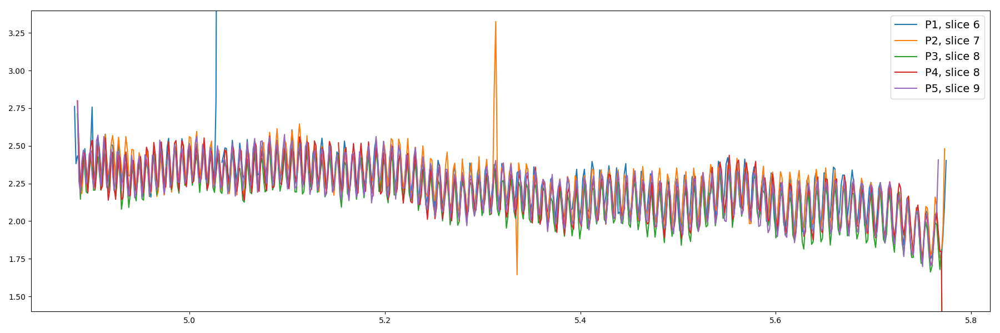

In [33]:
plt.figure(figsize=frame)
# for key in rasterscan_sci_imgs.keys():
#     plt.plot(lambcens,param_list[key][2],label=key)
plt.plot(lambcens,param_list['P1'][1],label='P1, slice {}'.format(param_list['P1'][0]))
plt.plot(lambcens,param_list['P2'][1],label='P2, slice {}'.format(param_list['P2'][0]))
plt.plot(lambcens,param_list['P3'][1],label='P3, slice {}'.format(param_list['P3'][0]))
plt.plot(lambcens,param_list['P4'][1]*0.88,label='P4, slice {}'.format(param_list['P4'][0]))
plt.plot(lambcens,param_list['P5'][1],label='P5, slice {}'.format(param_list['P5'][0]))
plt.legend(loc='best',fontsize=14)
plt.ylim(1.4,3.4)
plt.tight_layout()

<IPython.core.display.Javascript object>


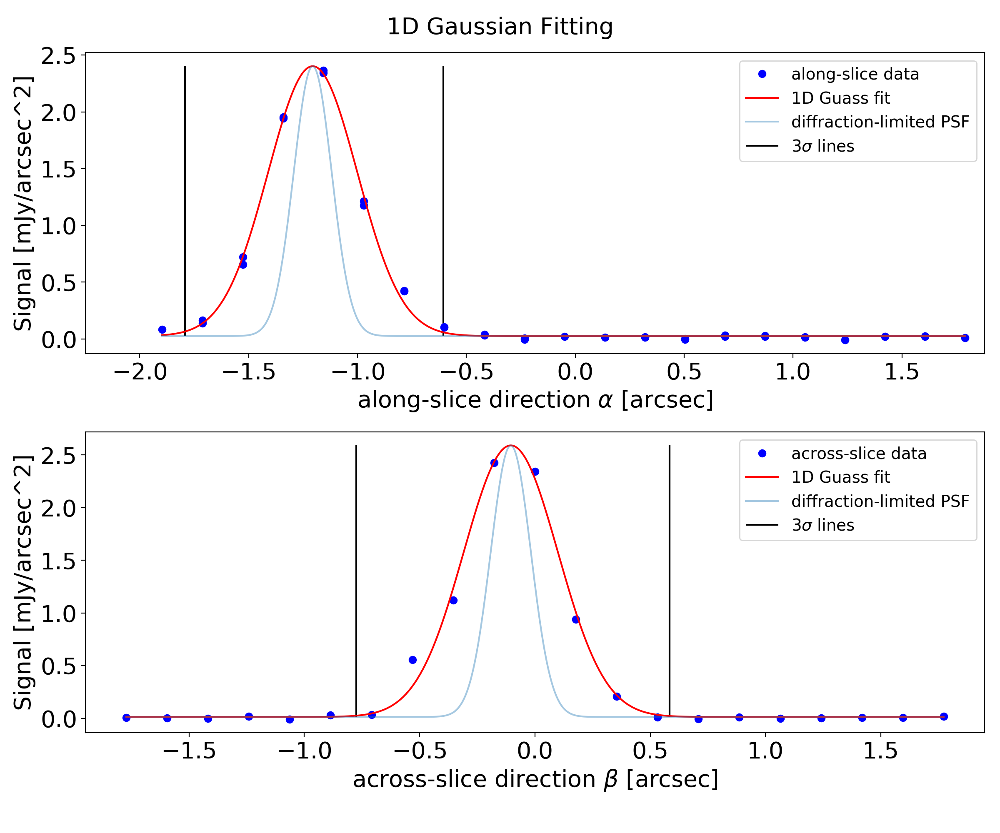

<IPython.core.display.Javascript object>


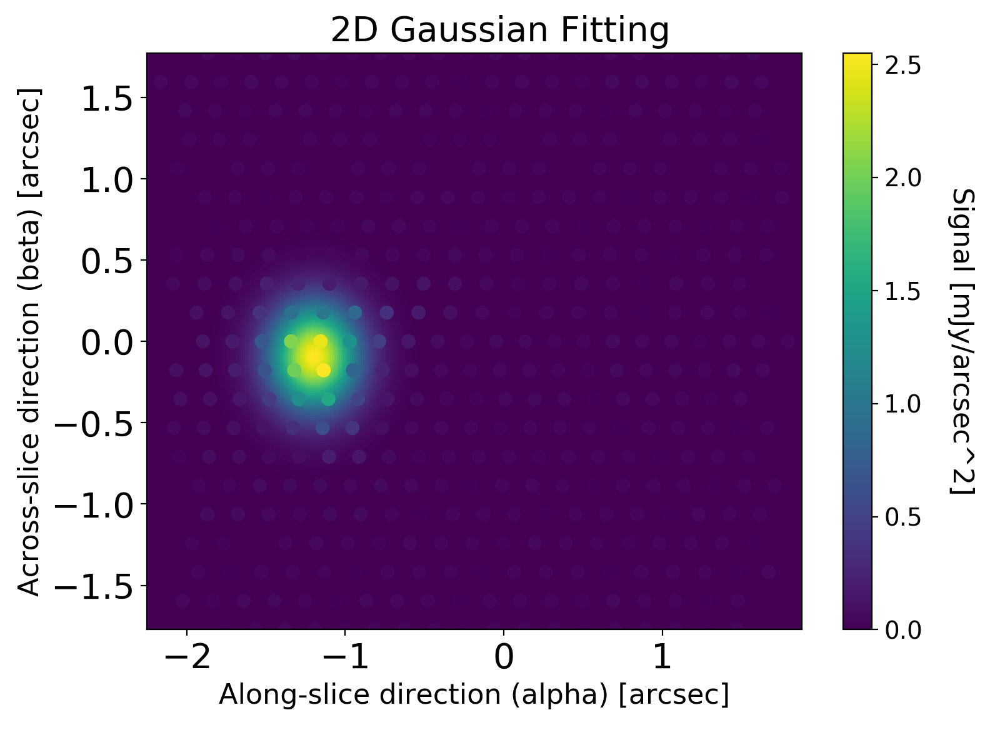

<IPython.core.display.Javascript object>


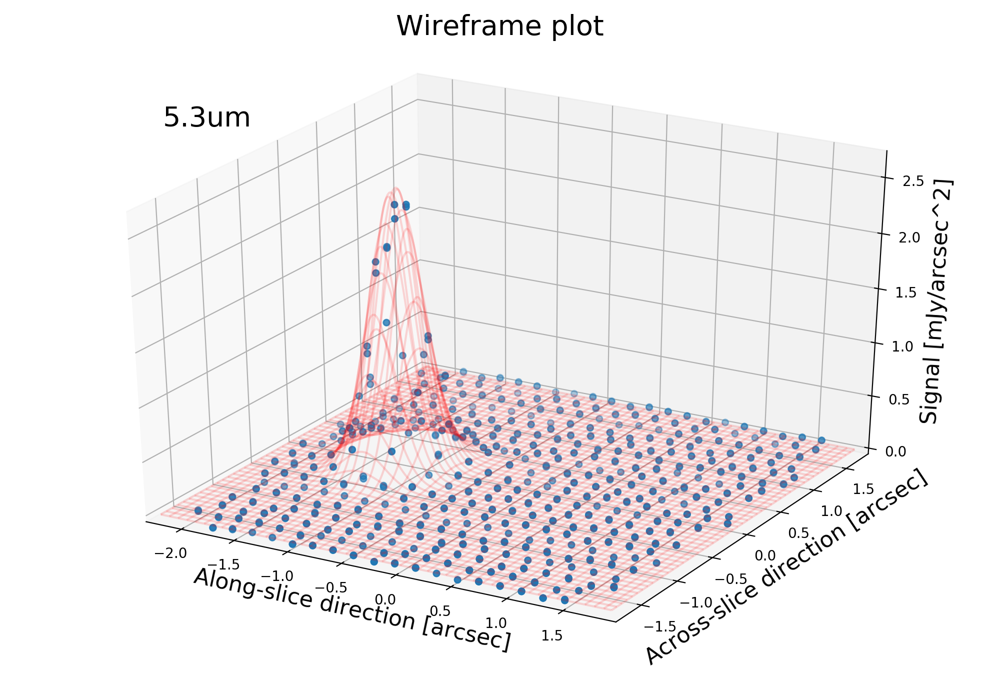

<IPython.core.display.Javascript object>


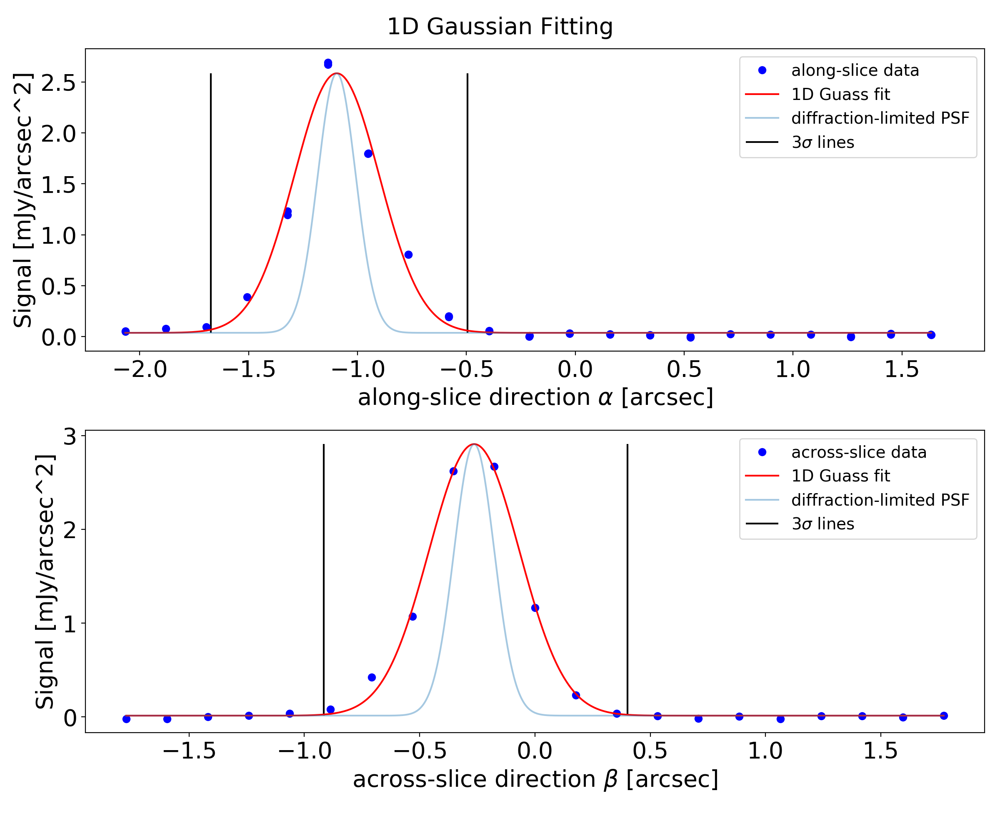

<IPython.core.display.Javascript object>


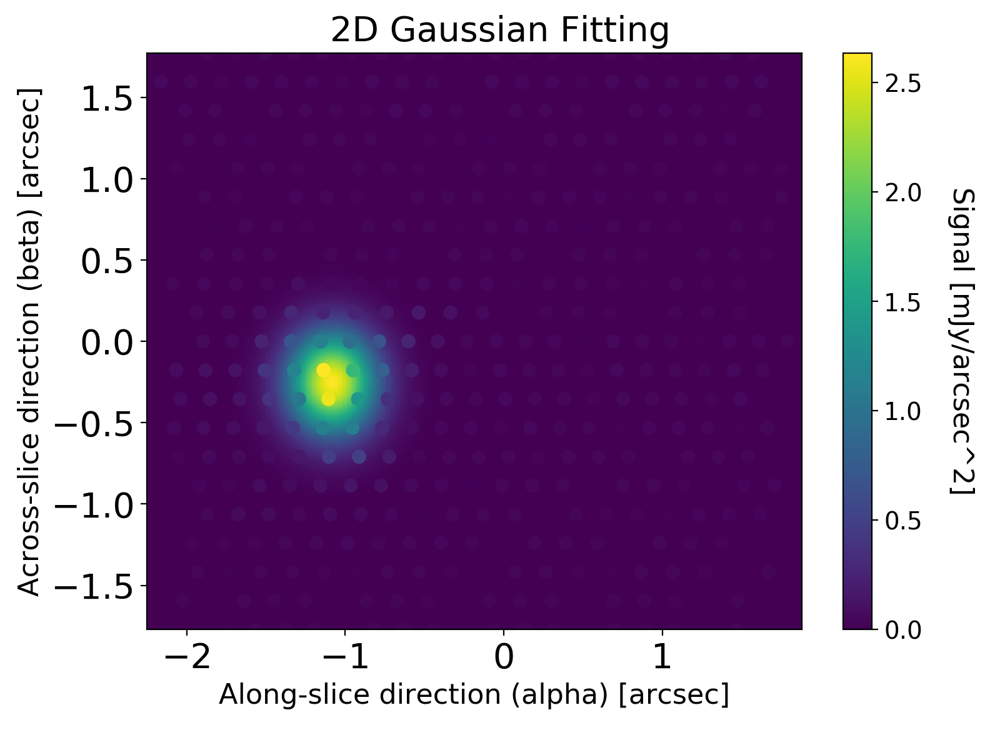

<IPython.core.display.Javascript object>


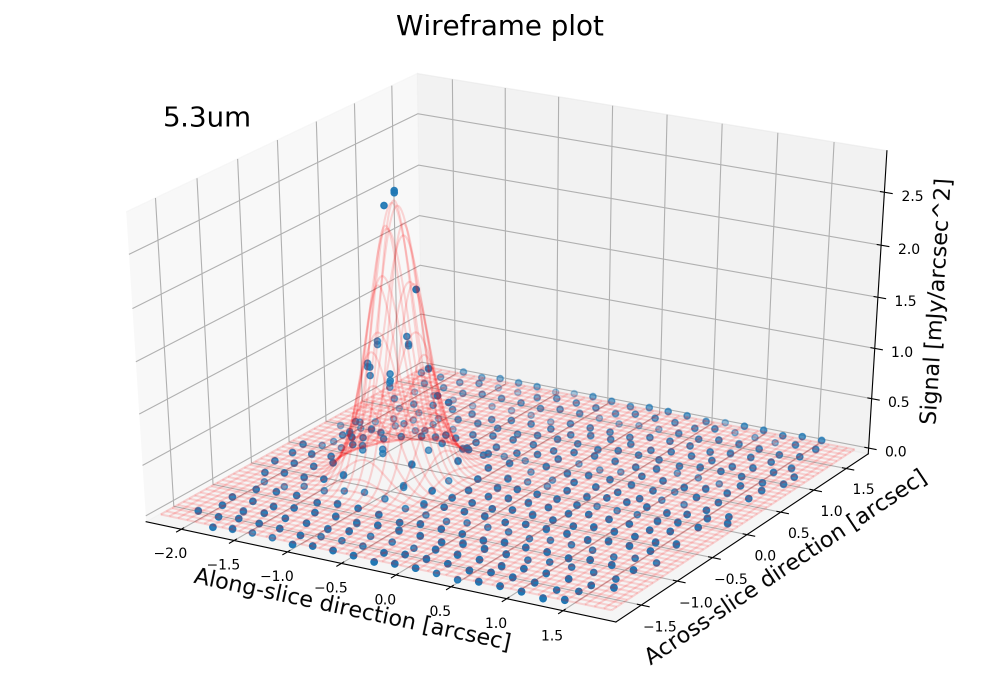

<IPython.core.display.Javascript object>


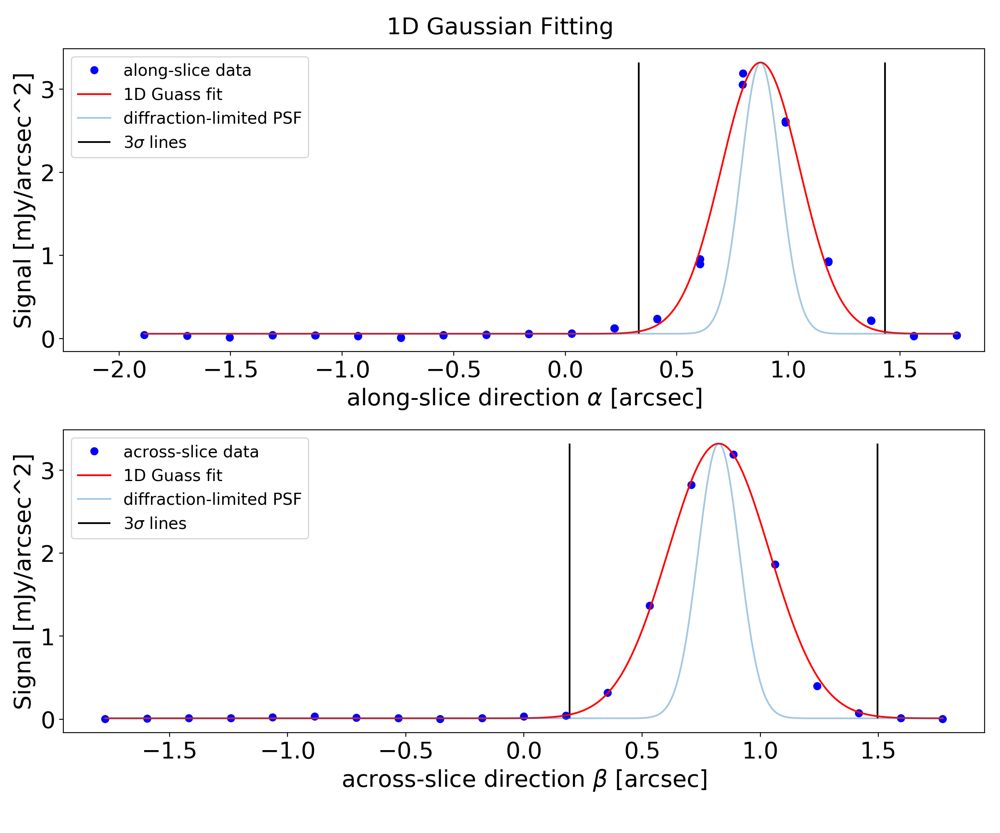

<IPython.core.display.Javascript object>


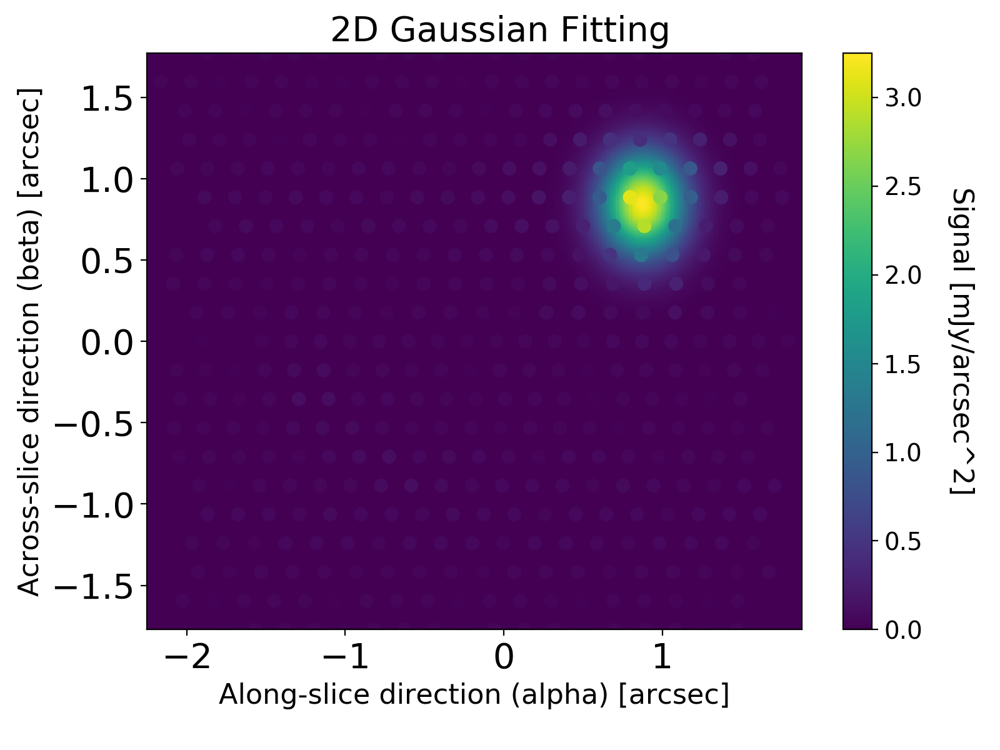

<IPython.core.display.Javascript object>


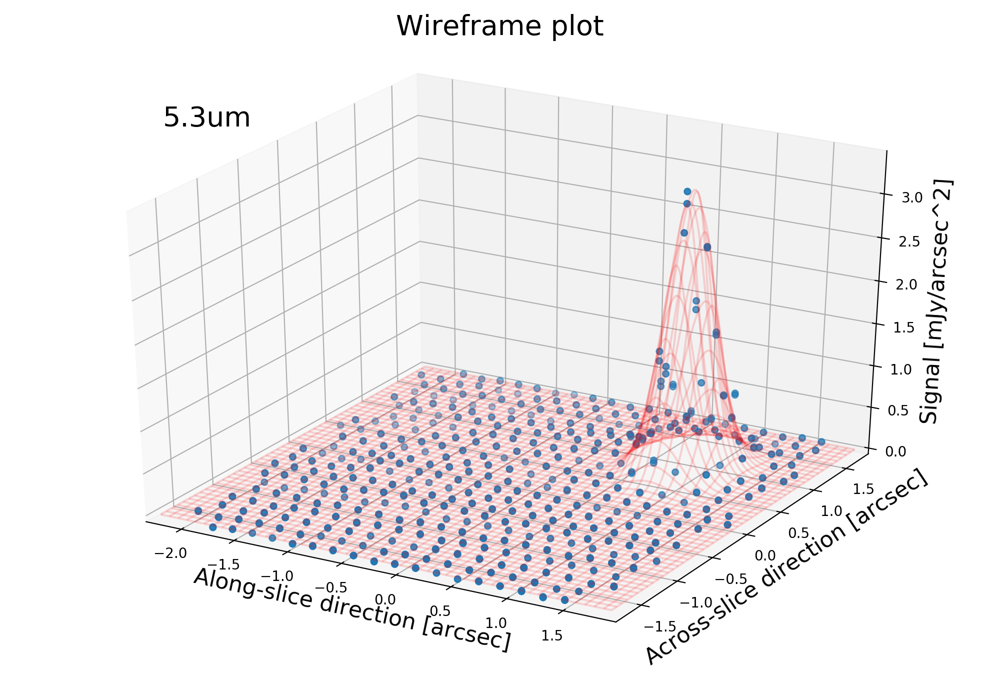

<IPython.core.display.Javascript object>


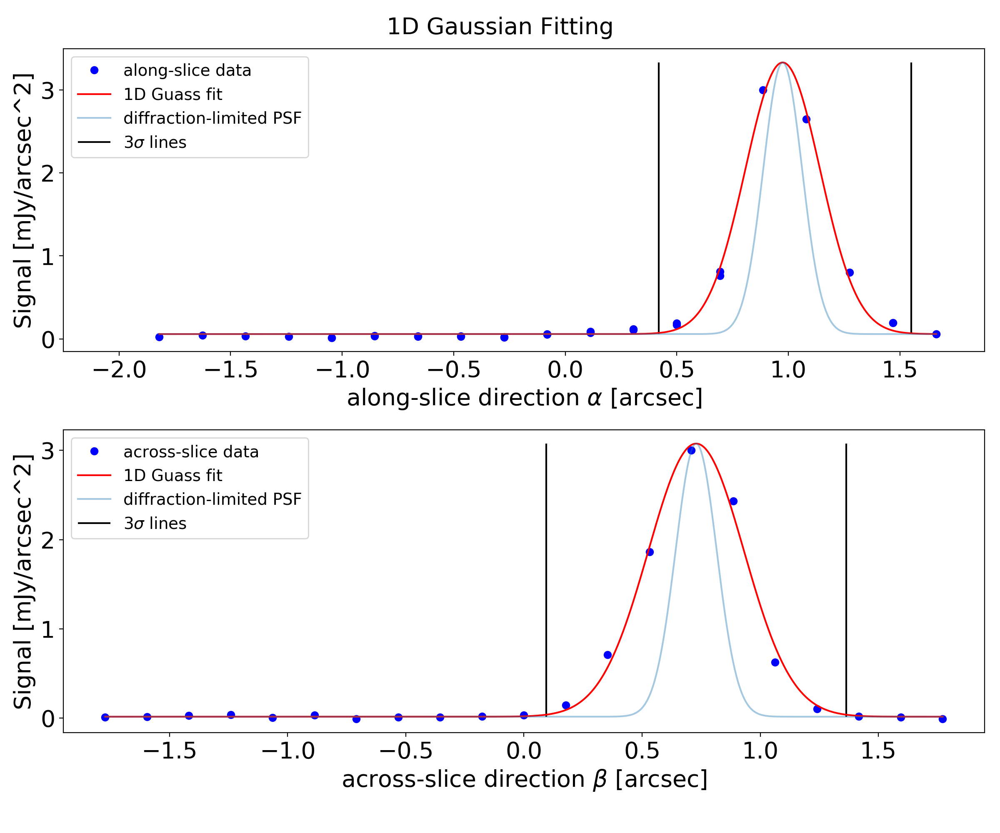

<IPython.core.display.Javascript object>


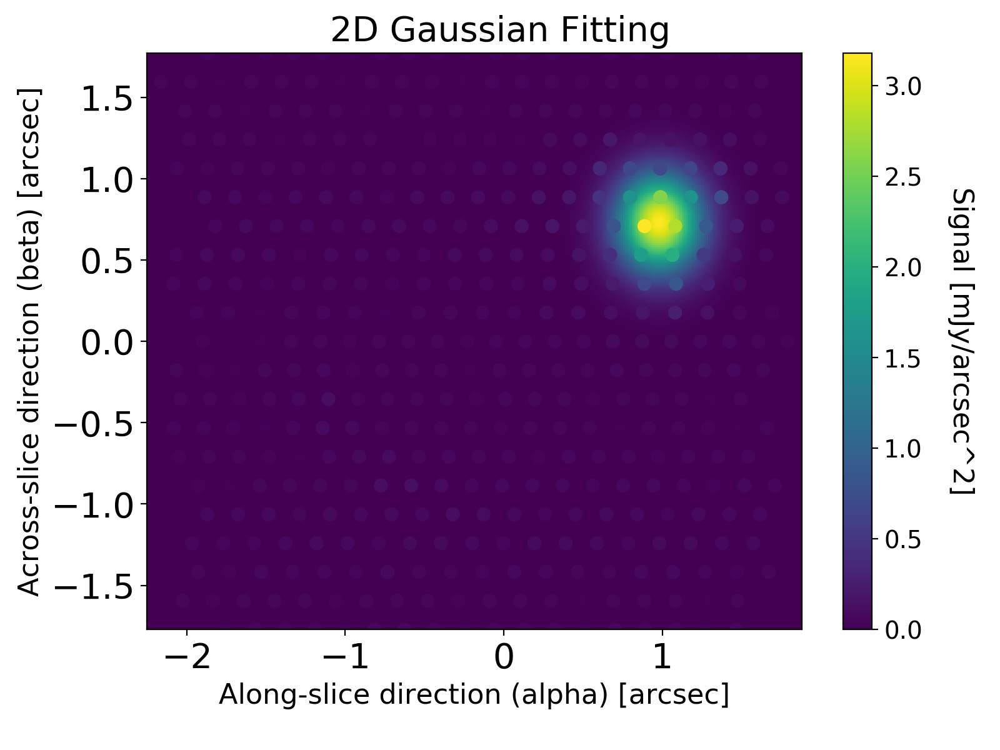

<IPython.core.display.Javascript object>


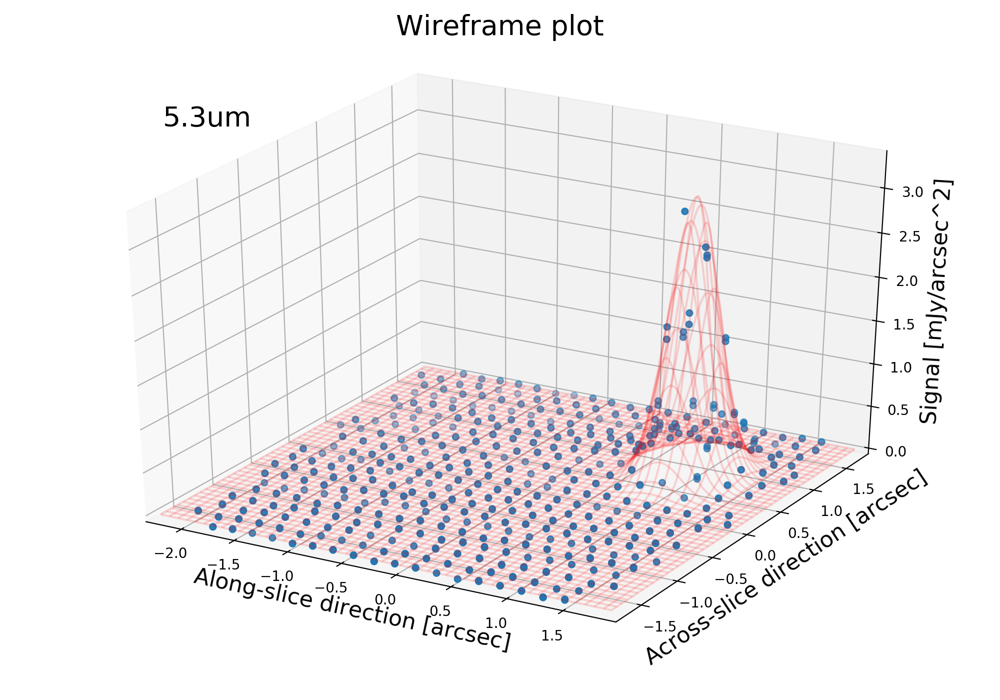

In [23]:
# make plots
ibin = len(lambcens)/2 +1
funcs.plot_point_source_centroiding(band=band,sci_img=sci_imgA,d2cMaps=d2cMaps,spec_grid=[lambcens,lambfwhms],centroid=[sign_ampA,alpha_centersA,beta_centersA,sigma_alphaA,sigma_betaA],ibin=ibin) # ,data='slope'
funcs.plot_point_source_centroiding(band=band,sci_img=sci_imgB,d2cMaps=d2cMaps,spec_grid=[lambcens,lambfwhms],centroid=[sign_ampB,alpha_centersB,beta_centersB,sigma_alphaB,sigma_betaB],ibin=ibin)
funcs.plot_point_source_centroiding(band=band,sci_img=sci_imgC,d2cMaps=d2cMaps,spec_grid=[lambcens,lambfwhms],centroid=[sign_ampC,alpha_centersC,beta_centersC,sigma_alphaC,sigma_betaC],ibin=ibin)
funcs.plot_point_source_centroiding(band=band,sci_img=sci_imgD,d2cMaps=d2cMaps,spec_grid=[lambcens,lambfwhms],centroid=[sign_ampD,alpha_centersD,beta_centersD,sigma_alphaD,sigma_betaD],ibin=ibin)

<IPython.core.display.Javascript object>


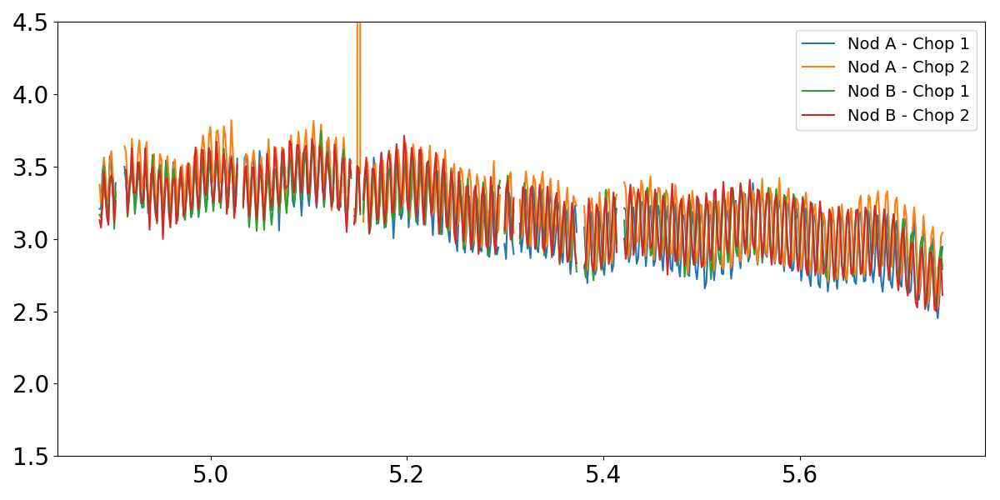

<IPython.core.display.Javascript object>


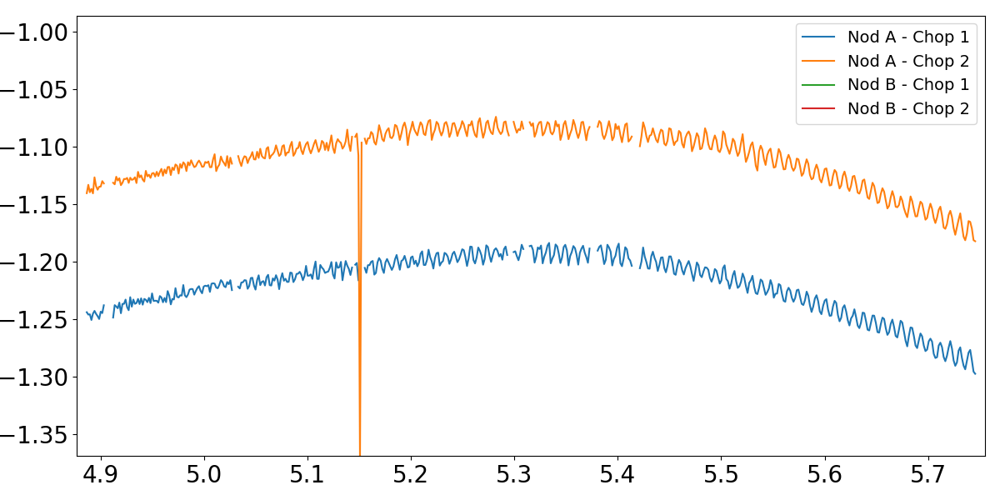

In [61]:
plt.figure(figsize=frame)
plt.plot(lambcens,sign_ampA*1.3,label='Nod A - Chop 1')
plt.plot(lambcens,sign_ampB*1.3,label='Nod A - Chop 2')
plt.plot(lambcens,sign_ampC,label='Nod B - Chop 1')
plt.plot(lambcens,sign_ampD,label='Nod B - Chop 2')
plt.ylim(1.5,4.5)
plt.legend(loc='upper right',fontsize=14)
plt.tick_params(axis='both',labelsize=20)
plt.tight_layout()

plt.figure(figsize=frame)
plt.plot(lambcens,alpha_centersA,label='Nod A - Chop 1')
plt.plot(lambcens,alpha_centersB,label='Nod A - Chop 2')
plt.plot(lambcens,alpha_centersC,label='Nod B - Chop 1')
plt.plot(lambcens,alpha_centersD,label='Nod B - Chop 2')
plt.legend(loc='upper right',fontsize=14)
plt.tick_params(axis='both',labelsize=20)
plt.tight_layout()

-1.22025420193 -0.0992779992905


<IPython.core.display.Javascript object>


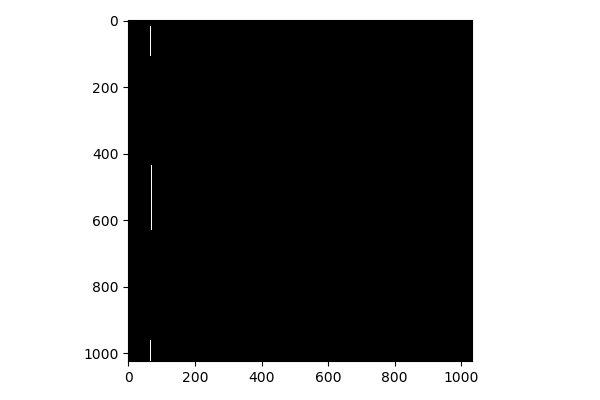

In [87]:
sliceMap  = d2cMaps['sliceMap']
lambdaMap = d2cMaps['lambdaMap']
alphaMap  = d2cMaps['alphaMap']
betaMap   = d2cMaps['betaMap']

alphapos = np.mean(alpha_centersA[~np.isnan(alpha_centersA)])
betapos = np.mean(beta_centersA[~np.isnan(beta_centersA)])

unique_betas = np.sort(np.unique(betaMap[(sliceMap>100*int(band[0])) & (sliceMap<100*(int(band[0])+1))]))

islice = funcs.find_nearest(unique_betas,betapos)+1
# take pixel trace along specified slice, specified alpha position
ypos,xpos = np.arange(det_dims[0]),np.zeros(det_dims[0]) # initialize placeholders
slice_img,alpha_img,valid_img = [np.full(det_dims,0.) for j in range(3)] # initialize placeholders
sel_pix = (sliceMap == 100*int(band[0])+islice) # select pixels with correct slice number
slice_img[sel_pix] = sliceMap[sel_pix] # image containing single slice
alpha_img[sel_pix] = alphaMap[sel_pix] # image containing alpha positions in single slice

# trace is built by taking the pixel in every detector row with alpha value closest to the one specified
for i in ypos:
    xpos[i] = np.argmin(alpha_img[i,:])+funcs.find_nearest(alpha_img[i,:][(slice_img[i,:]!=0)],alphapos)
xpos = xpos.astype(int)


<IPython.core.display.Javascript object>


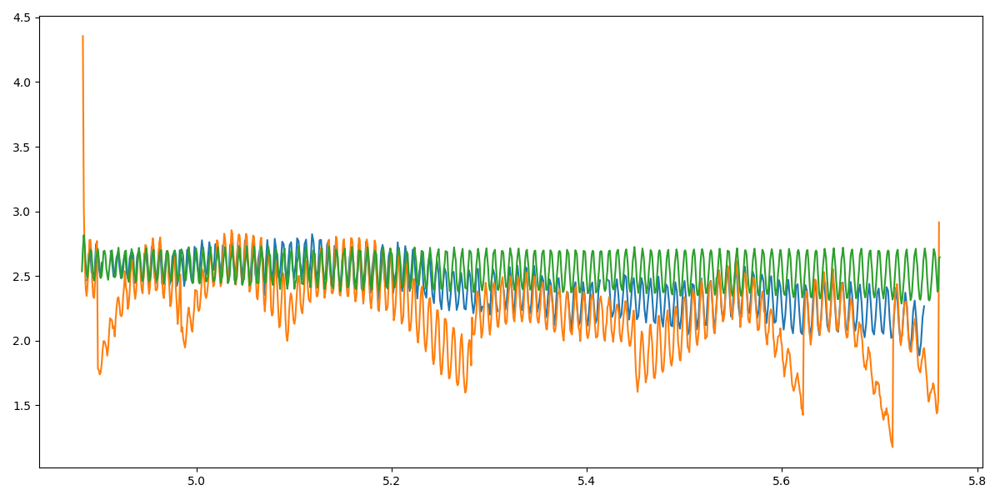

In [113]:
plt.figure(figsize=frame)
plt.plot(lambcens,sign_ampA)
plt.plot(lambdaMap[ypos,xpos],sci_imgA[ypos,xpos])
plt.plot(lambdaMap[ypos,xpos],fringe_img[ypos,xpos]*2.7)
plt.tight_layout()


In [102]:
import scipy.interpolate as scp_interpolate

slopeMap = np.full(det_dims,np.nan)
i,j = np.where((lambdaMap != 0) & (lambdaMap>=lambcens[~np.isnan(sign_ampA)].min()) & (lambdaMap<=lambcens[~np.isnan(sign_ampA)].max()))
slopeMap[i,j] = scp_interpolate.interp1d(lambcens[~np.isnan(sign_ampA)],sign_ampA[~np.isnan(sign_ampA)],kind='cubic')(lambdaMap[i,j])

<IPython.core.display.Javascript object>


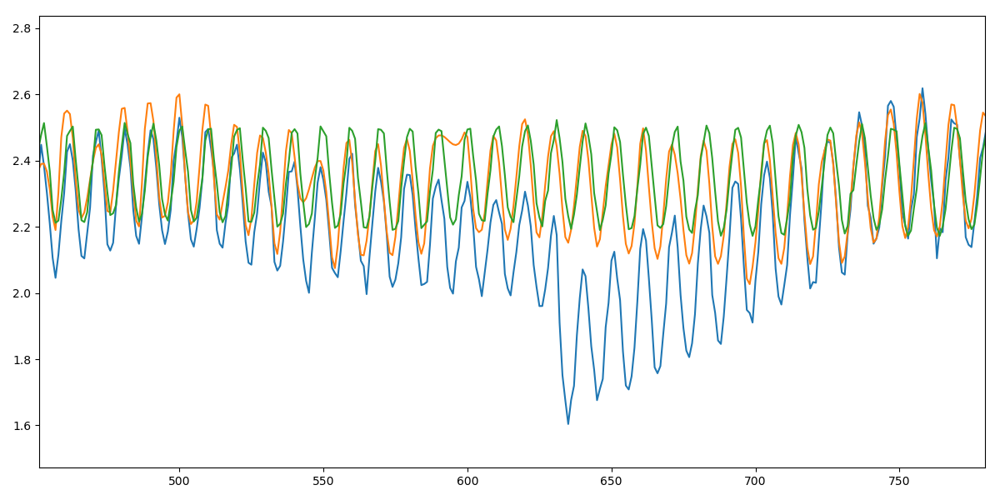

In [108]:
plt.figure(figsize=frame)
plt.plot(sci_imgA[ypos,xpos])
plt.plot(slopeMap[ypos,xpos])
plt.plot(fringe_img[ypos,xpos]*2.5)
plt.tight_layout()

## Summary:  
Insert summary here